# LFP Spectrogram × PC1 — Sessions Passing PC1 Criteria

For each session that passes the PC1 agreement criteria, the LFP is compiled into a
**frequency × trial** spectrogram: within each trial the per-contact PSD is computed
(Hann-windowed periodogram, `NFFT=128`, freq res ≈ 0.47 Hz) and the resulting
(n_freqs × n_trials) matrix is shown as a colourmap image.

The **PC1** of the anchored-label matrix (all cells in the session) is overlaid on the
same trial axis so that LFP oscillatory features can be compared directly to the
population anchoring state.

One figure panel per contact (shallow → deep), jet colourmap, dB scale.

**LFP path:** `{LFP_BASE}/M{mouse}/D{day}/VR/sub-M{mouse}_ses-D{day}_typ-VR_lfp.npz`

In [1]:
%matplotlib inline
import sys, warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from scipy.signal import periodogram
from sklearn.decomposition import PCA

sys.path.insert(0, '/Users/harryclark/Documents/spatial-manifolds/src')
from spatial_manifolds.detect_grids import compute_vr_tcs, get_kmeans_spatial_labels
from spatial_manifolds.toroidal import spectral_analysis

# ── Paths ─────────────────────────────────────────────────────────────────────
SOURCE_PATH = '/Users/harryclark/Downloads/COHORT12/'
LFP_BASE    = Path('/Users/harryclark/Downloads/COHORT12/LFP')
LOCS_CSV    = '/Users/harryclark/Downloads/COHORT12/all_cluster_brain_locations_chris.csv'
FLAGS_CSV   = '/Users/harryclark/Documents/spatial-manifolds/data/task_anchoring_cell_flags.csv'
CELLS_CSV   = '/Users/harryclark/Documents/spatial-manifolds/data/cell_classifications_no_regions.csv'
OUT_DIR     = Path('/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_6_task_anchoring')

# ── LFP parameters ────────────────────────────────────────────────────────────
FS          = 60.0    # sampling rate (Hz)
FMAX        = 20.0    # max display frequency (Hz)
NFFT_TRIAL  = 128     # FFT length per trial → freq res = 60/128 ≈ 0.47 Hz

# ── Anchoring parameters (must match task_anchoring_catalogue.ipynb) ──────────
bs          = 2       # cm per spatial bin
tl          = 200     # track length (cm)
TARGET_FREQS = np.arange(1, 6) * bs / tl   # [0.01 … 0.05] cm⁻¹
EDGE_TRIALS  = int(1600 / (2 * (tl / bs))) # = 8

N_CONTACTS  = 6   # representative contacts per session

# ── Derived frequency axis (fixed across all trials) ─────────────────────────
_f_all   = np.fft.rfftfreq(NFFT_TRIAL, 1.0 / FS)
_fmask   = _f_all <= FMAX
FREQ_AXIS = _f_all[_fmask]   # shape (n_freqs,)

print(f'NFFT_TRIAL={NFFT_TRIAL}  freq_res={FS/NFFT_TRIAL:.3f} Hz  '
      f'n_freqs={_fmask.sum()}  EDGE_TRIALS={EDGE_TRIALS}')

NFFT_TRIAL=128  freq_res=0.469 Hz  n_freqs=43  EDGE_TRIALS=8


In [2]:
# ── Ranked list of passing sessions with LFP availability ─────────────────────
df_flags = pd.read_csv(FLAGS_CSV)
df_pass  = (
    df_flags[df_flags['session_passes'] == True]
    [['mouse', 'day', 'agree_frac', 'pc1_enrichment', 'pc1_dominance']]
    .drop_duplicates()
    .sort_values('agree_frac', ascending=False)
    .reset_index(drop=True)
)

def _lfp_path(mouse, day):
    return LFP_BASE / f'M{mouse}' / f'D{day}' / 'VR' / f'sub-M{mouse}_ses-D{day}_typ-VR_lfp.npz'

df_pass['lfp_available'] = df_pass.apply(
    lambda r: _lfp_path(int(r.mouse), int(r.day)).exists(), axis=1
)

print('Passing sessions ranked by agree_frac:')
print('=' * 72)
for i, r in df_pass.iterrows():
    status = 'LOCAL' if r.lfp_available else 'NEED DOWNLOAD'
    print(
        f"{i+1:2d}. M{int(r.mouse)}D{int(r.day):<3d}  "
        f"agree={r.agree_frac:.3f}  "
        f"enrich={r.pc1_enrichment:6.2f}x  "
        f"dom={r.pc1_dominance:5.2f}  "
        f"[{status}]"
    )

print(f'\nSessions with LFP locally: {df_pass["lfp_available"].sum()} / {len(df_pass)}')

Passing sessions ranked by agree_frac:
 1. M22D34   agree=0.992  enrich=100.85x  dom= 4.63  [LOCAL]
 2. M22D37   agree=0.988  enrich= 49.83x  dom= 3.92  [LOCAL]
 3. M22D35   agree=0.987  enrich= 56.60x  dom= 7.01  [LOCAL]
 4. M22D40   agree=0.908  enrich= 72.42x  dom= 3.12  [LOCAL]
 5. M27D26   agree=0.879  enrich= 18.45x  dom= 9.16  [LOCAL]
 6. M27D20   agree=0.867  enrich=  9.62x  dom= 3.25  [LOCAL]
 7. M28D17   agree=0.796  enrich= 35.01x  dom= 3.13  [LOCAL]
 8. M26D18   agree=0.764  enrich= 46.12x  dom=10.97  [LOCAL]
 9. M25D24   agree=0.723  enrich= 31.15x  dom= 7.96  [LOCAL]
10. M25D20   agree=0.705  enrich= 24.55x  dom= 6.60  [LOCAL]
11. M28D16   agree=0.700  enrich= 30.90x  dom= 2.51  [LOCAL]
12. M29D21   agree=0.628  enrich= 32.34x  dom= 2.26  [LOCAL]
13. M29D17   agree=0.625  enrich= 30.01x  dom= 2.15  [LOCAL]
14. M29D25   agree=0.612  enrich= 50.09x  dom= 2.22  [LOCAL]
15. M25D25   agree=0.603  enrich= 47.28x  dom= 4.13  [LOCAL]
16. M28D19   agree=0.584  enrich= 32.81x  dom=

In [3]:
# ── Helper functions ───────────────────────────────────────────────────────────

# Load support tables once
_locs  = pd.read_csv(LOCS_CSV)
_locs['mouse'] = _locs['mouse'].astype(int)
_locs['day']   = _locs['day'].astype(int)

_df_all = pd.read_csv(CELLS_CSV)
_df_all['mouse']      = _df_all['mouse'].astype(int)
_df_all['day']        = _df_all['day'].astype(int)
_df_all['cluster_id'] = _df_all['cluster_id'].astype(int)


# ── Contact selection ─────────────────────────────────────────────────────────

def _simplify_region(reg):
    for prefix in ('ENTm', 'ENTl', 'ENT', 'VIS', 'PAR', 'PRE', 'SUB', 'CA1', 'CA3', 'DG'):
        if str(reg).upper().startswith(prefix.upper()):
            return prefix
    return str(reg)[:5]


def _select_contacts(mouse, day, n=N_CONTACTS):
    sub = _locs[(_locs['mouse'] == mouse) & (_locs['day'] == day)].copy()
    sub = sub.dropna(subset=['channel_id', 'unit_location_y'])
    sub = sub.drop_duplicates(subset=['channel_id']).sort_values('unit_location_y')

    if len(sub) >= n:
        rows = sub.iloc[np.linspace(0, len(sub) - 1, n, dtype=int)]
        contacts = []
        for _, row in rows.iterrows():
            ch = str(row['channel_id'])
            contacts.append({
                'col_idx':    int(ch.replace('CH', '')) - 1,
                'channel_id': ch,
                'region':     _simplify_region(row['brain_region']),
                'depth_um':   int(row['unit_location_y']),
                'shank_id':   int(row.get('shank_id', 0)),
            })
        return contacts

    # Fallback: uniform sample across all 384 channels
    return [{'col_idx': int(i), 'channel_id': f'CH{i+1}',
              'region': 'unknown', 'depth_um': None, 'shank_id': 0}
            for i in np.linspace(0, 383, n, dtype=int)]


# ── Trial-based LFP spectrogram ───────────────────────────────────────────────

def _compute_trial_psd(d_col, t_lfp, trial_starts, trial_ends):
    """
    PSD averaged within each trial, returning (n_freqs, n_trials) in dB.
    Uses a Hann-windowed periodogram with NFFT=NFFT_TRIAL for a consistent
    frequency axis regardless of trial length.
    """
    n_trials = len(trial_starts)
    psd_mat  = np.full((len(FREQ_AXIS), n_trials), np.nan)

    for i, (ts, te) in enumerate(zip(trial_starts, trial_ends)):
        mask = (t_lfp >= ts) & (t_lfp < te)
        seg  = d_col[mask].astype(float)
        if len(seg) < 8:
            continue
        _, pxx = periodogram(seg, fs=FS, nfft=NFFT_TRIAL, window='hann')
        psd_mat[:, i] = 10.0 * np.log10(pxx[_fmask] + 1e-12)

    return psd_mat


# ── Anchoring PC1 ─────────────────────────────────────────────────────────────

def _compute_anchoring_labels(cid, tcs):
    tc = tcs.get(cid)
    if tc is None or len(tc) == 0:
        return None
    try:
        _DUMMY  = cid + 100000
        results = spectral_analysis({cid: tc, _DUMMY: tc}, tl, bs)
        fvalid  = results[5]
        freq_idx    = [int(np.argmin(np.abs(fvalid - f))) for f in TARGET_FREQS]
        lbl_per_win = np.isin(np.argmax(results[3][0], axis=0), freq_idx).astype(int)
        labels = get_kmeans_spatial_labels(tc, lbl_per_win, bs=bs, tl=tl).astype(float)
        labels[:EDGE_TRIALS]  = np.nan
        labels[-EDGE_TRIALS:] = np.nan
        return labels
    except Exception:
        return None


def _pca_cell_agreement(labels, n_pcs=5):
    n_cells    = len(labels)
    max_trials = max(len(l) for l in labels)
    smoothed   = np.full((n_cells, max_trials), 0.5)
    for i, lab in enumerate(labels):
        s = pd.Series(lab).rolling(5, center=True, min_periods=1).mean()
        smoothed[i, :len(lab)] = s.fillna(0.5).values

    k    = min(n_pcs, n_cells, max_trials)
    pca  = PCA(n_components=k)
    trial_score = pca.fit_transform(smoothed.T)[:, 0]
    enrichment  = pca.explained_variance_ratio_ * n_cells

    cell_corr = np.array([np.corrcoef(smoothed[i], trial_score)[0, 1]
                           for i in range(n_cells)])
    if (cell_corr > 0).sum() < n_cells / 2:
        trial_score = -trial_score
        cell_corr   = -cell_corr

    return trial_score, cell_corr, float(pca.explained_variance_ratio_[0]), enrichment


def _compute_session_pc1(mouse, day, tcs):
    """Returns (trial_score, n_cells) or (None, 0)."""
    sess   = _df_all[(_df_all['mouse'] == mouse) & (_df_all['day'] == day)]
    labels = [_compute_anchoring_labels(int(r.cluster_id), tcs)
              for _, r in sess.iterrows()]
    labels = [l for l in labels if l is not None]
    if len(labels) < 4:
        return None, 0
    trial_score, _, _, _ = _pca_cell_agreement(labels)
    return trial_score, len(labels)


print('Helpers loaded.')

Helpers loaded.


In [4]:
# ── Plot function: frequency × trial spectrogram + PC1 overlay ────────────────

def plot_session_lfp(mouse, day, agree_frac, pc1_enrichment, pc1_dominance,
                     n_contacts=N_CONTACTS, save=True):

    lfp_file = _lfp_path(mouse, day)
    if not lfp_file.exists():
        print(f'  M{mouse}D{day}: LFP file not found — skip')
        return None

    # ── Load neural data and compute PC1 ──────────────────────────────────────
    print(f'M{mouse}D{day}: loading spikes ...', end=' ', flush=True)
    try:
        tcs, _, _, _, beh, _ = compute_vr_tcs(mouse, day, source_path=SOURCE_PATH)
    except Exception as e:
        print(f'spike load failed: {e}')
        return None

    trial_starts_all = np.array(beh['trials'].start)
    trial_ends_all   = np.array(beh['trials'].end)

    print(f'n_trials_beh={len(trial_starts_all)}  computing PC1 ...', end=' ', flush=True)
    trial_score, n_cells_pc1 = _compute_session_pc1(mouse, day, tcs)
    if trial_score is None:
        print('too few cells for PC1')
        return None

    # trial_score length may be shorter than beh['trials'] because labels are
    # clipped by last_ephys_bin — use the shorter length as the common axis
    n_trials     = len(trial_score)
    trial_starts = trial_starts_all[:n_trials]
    trial_ends   = trial_ends_all[:n_trials]
    print(f'n_trials_pc1={n_trials}  n_cells={n_cells_pc1}')

    # Normalise PC1 to [0, 1] for display
    ts_min   = trial_score.min()
    ts_range = trial_score.max() - ts_min
    ts_norm  = (trial_score - ts_min) / (ts_range + 1e-8)

    # ── Load LFP ──────────────────────────────────────────────────────────────
    print(f'  loading LFP ...', end=' ', flush=True)
    raw   = np.load(lfp_file, allow_pickle=True)
    d     = raw['d']       # (n_times, 384) int16
    t_lfp = raw['t']       # (n_times,) seconds
    print(f'd={d.shape}')

    contacts = _select_contacts(mouse, day, n=n_contacts)

    # ── Compute trial-based PSD per contact ───────────────────────────────────
    psd_mats = []
    for c in contacts:
        psd = _compute_trial_psd(d[:, c['col_idx']], t_lfp, trial_starts, trial_ends)
        psd_mats.append(psd)   # each: (n_freqs, n_trials)

    # Shared colour limits (2nd–98th pct across all contacts, valid trials only)
    all_vals = np.concatenate([m[np.isfinite(m)] for m in psd_mats])
    vmin, vmax = np.percentile(all_vals, [2, 98])

    # ── Figure layout ─────────────────────────────────────────────────────────
    # Row 0: PC1 (thin).  Rows 1..n: one spectrogram per contact.
    # Col 0: contact label (text).  Col 1: spectrogram / PC1.
    n    = len(contacts)
    fig  = plt.figure(figsize=(10, 0.7 + 1.3 * n))
    gs   = gridspec.GridSpec(
        n + 1, 2,
        height_ratios=[0.7] + [1.3] * n,
        width_ratios=[0.45, 9.55],
        hspace=0.06, wspace=0.02,
        left=0.04, right=0.97, top=0.91, bottom=0.08,
    )

    trial_x = np.arange(n_trials)

    # ── PC1 row ───────────────────────────────────────────────────────────────
    ax_pc1_label = fig.add_subplot(gs[0, 0])
    ax_pc1       = fig.add_subplot(gs[0, 1])
    ax_pc1_label.axis('off')
    ax_pc1_label.text(1.0, 0.5, 'PC1', ha='right', va='center',
                      fontsize=7, transform=ax_pc1_label.transAxes)

    ax_pc1.plot(trial_x, ts_norm, color='#333333', lw=1.0)
    ax_pc1.fill_between(trial_x, 0.5, ts_norm,
                         where=(ts_norm >= 0.5), color='#9d5391', alpha=0.4)
    ax_pc1.fill_between(trial_x, ts_norm, 0.5,
                         where=(ts_norm < 0.5),  color='#e7d7e8', alpha=0.4)
    ax_pc1.axhline(0.5, color='k', lw=0.5, ls='--', alpha=0.4)
    ax_pc1.set_xlim(0, n_trials - 1)
    ax_pc1.set_ylim(-0.05, 1.05)
    ax_pc1.set_yticks([0, 1])
    ax_pc1.set_yticklabels(['low', 'high'], fontsize=6)
    ax_pc1.set_xticklabels([])
    ax_pc1.tick_params(labelsize=7)
    ax_pc1.spines['top'].set_visible(False)
    ax_pc1.spines['right'].set_visible(False)
    ax_pc1.spines['bottom'].set_visible(False)

    # ── Spectrogram rows ──────────────────────────────────────────────────────
    im_last = None
    for i, (c, psd) in enumerate(zip(contacts, psd_mats)):
        ax_lbl = fig.add_subplot(gs[i + 1, 0])
        ax_sg  = fig.add_subplot(gs[i + 1, 1])

        # Label
        ax_lbl.axis('off')
        depth_str = f"{c['depth_um']} µm" if c['depth_um'] is not None else ''
        ax_lbl.text(1.0, 0.5,
                    f"{c['channel_id']}\n{c['region']}\n{depth_str}",
                    ha='right', va='center', fontsize=6.5,
                    transform=ax_lbl.transAxes)

        # Spectrogram: (n_freqs, n_trials) → imshow with origin='lower'
        im = ax_sg.imshow(
            psd,
            aspect='auto',
            origin='lower',
            extent=[-0.5, n_trials - 0.5, FREQ_AXIS[0], FREQ_AXIS[-1]],
            cmap='jet',
            vmin=vmin, vmax=vmax,
            interpolation='nearest',
        )
        im_last = im

        # PC1 overlay (normalised [0,1] → scaled to [0, FMAX] Hz)
        pc1_freq = ts_norm * FMAX
        ax_sg.plot(trial_x, pc1_freq, color='white', lw=1.0, alpha=0.85)

        ax_sg.set_xlim(-0.5, n_trials - 0.5)
        ax_sg.set_ylim(FREQ_AXIS[0], FREQ_AXIS[-1])
        ax_sg.set_ylabel('Freq (Hz)', fontsize=7)
        ax_sg.tick_params(labelsize=7)
        if i < n - 1:
            ax_sg.set_xticklabels([])
        else:
            ax_sg.set_xlabel('Trial', fontsize=8)
        ax_sg.spines['top'].set_visible(False)
        ax_sg.spines['right'].set_visible(False)

    # Colorbar
    cbar_ax = fig.add_axes([0.60, 0.01, 0.30, 0.016])
    plt.colorbar(im_last, cax=cbar_ax, orientation='horizontal',
                 label='Power (dB)', ticklocation='bottom')
    cbar_ax.tick_params(labelsize=7)

    fig.suptitle(
        f'M{mouse}D{day}  |  agree={agree_frac:.3f}  '
        f'enrich={pc1_enrichment:.1f}x  dom={pc1_dominance:.1f}  '
        f'|  PC1 over {n_cells_pc1} cells  |  {n} contacts shallow→deep',
        fontsize=9, y=0.98,
    )

    if save:
        fname = OUT_DIR / f'M{mouse}D{day}_lfp_spectrogram.pdf'
        fig.savefig(fname, bbox_inches='tight', dpi=150)
        print(f'  Saved → {fname.name}')

    return fig


print('Plot function ready.')

Plot function ready.


M22D34: loading spikes ... n_trials_beh=193  computing PC1 ... n_trials_pc1=190  n_cells=240
  loading LFP ... d=(108177, 384)
  Saved → M22D34_lfp_spectrogram.pdf


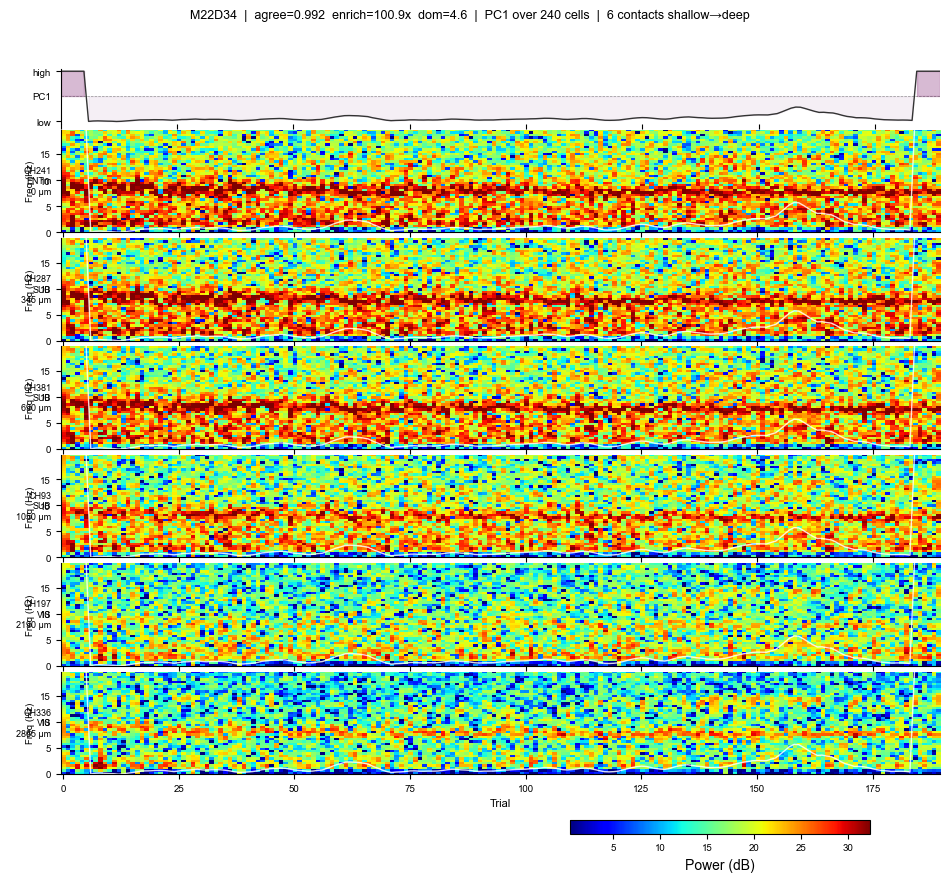

M22D37: loading spikes ... n_trials_beh=227  computing PC1 ... n_trials_pc1=226  n_cells=163
  loading LFP ... d=(108466, 384)
  Saved → M22D37_lfp_spectrogram.pdf


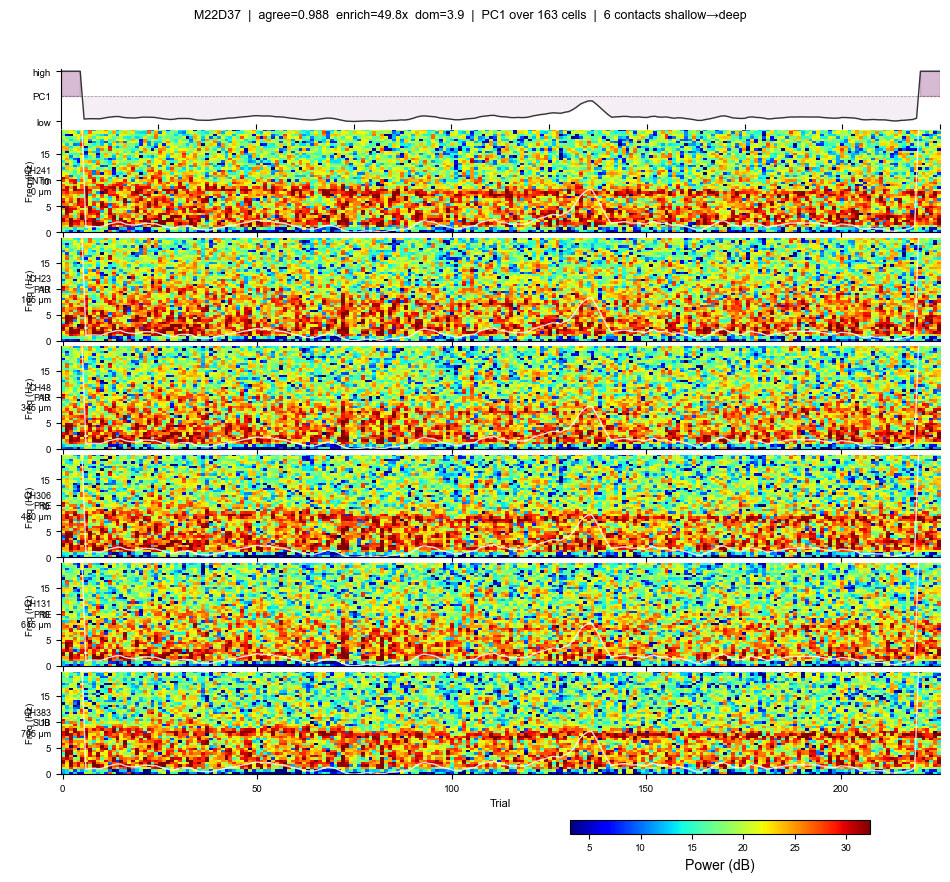

M22D35: loading spikes ... n_trials_beh=220  computing PC1 ... n_trials_pc1=219  n_cells=150
  loading LFP ... d=(108036, 384)
  Saved → M22D35_lfp_spectrogram.pdf


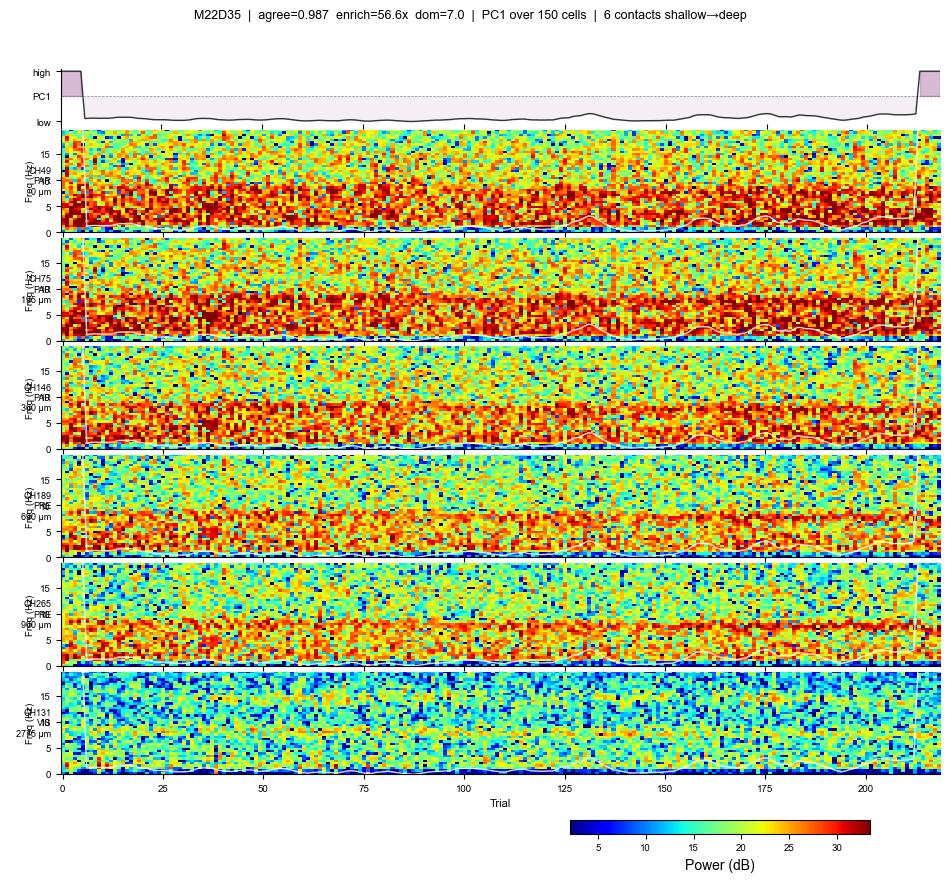

M22D40: loading spikes ... n_trials_beh=271  computing PC1 ... n_trials_pc1=270  n_cells=315
  loading LFP ... d=(107328, 384)
  Saved → M22D40_lfp_spectrogram.pdf


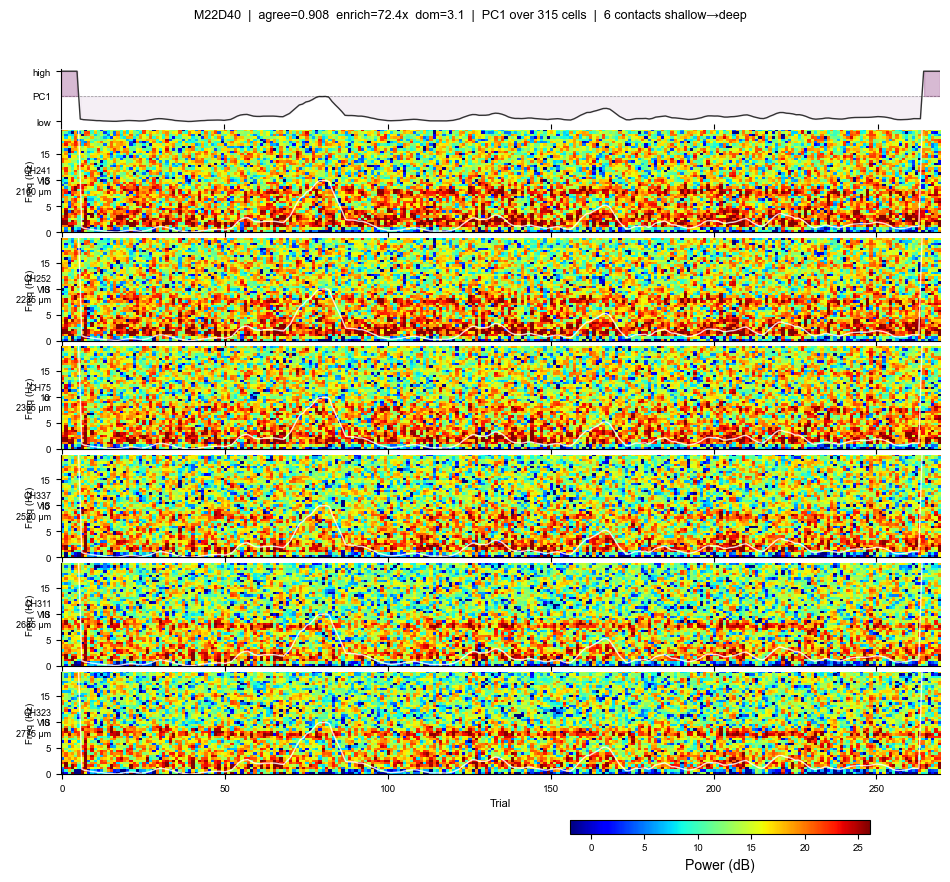

M27D26: loading spikes ... n_trials_beh=362  computing PC1 ... n_trials_pc1=362  n_cells=33
  loading LFP ... d=(107297, 384)
  Saved → M27D26_lfp_spectrogram.pdf


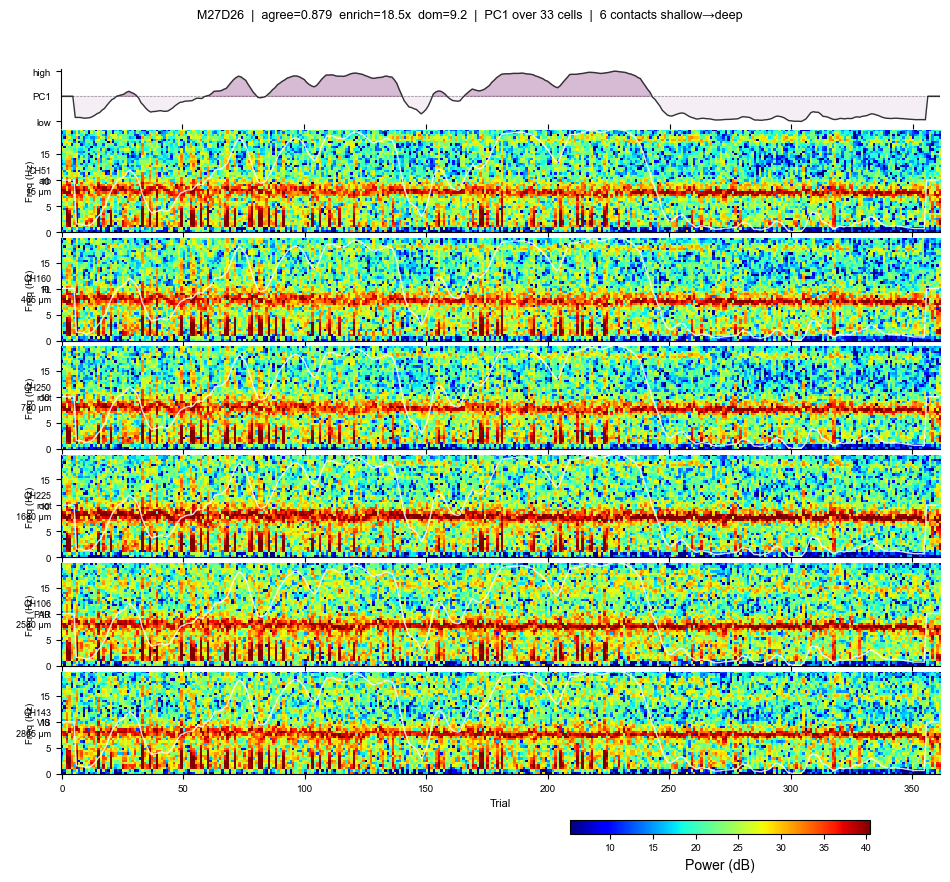

M27D20: loading spikes ... n_trials_beh=376  computing PC1 ... n_trials_pc1=372  n_cells=30
  loading LFP ... d=(108985, 384)
  Saved → M27D20_lfp_spectrogram.pdf


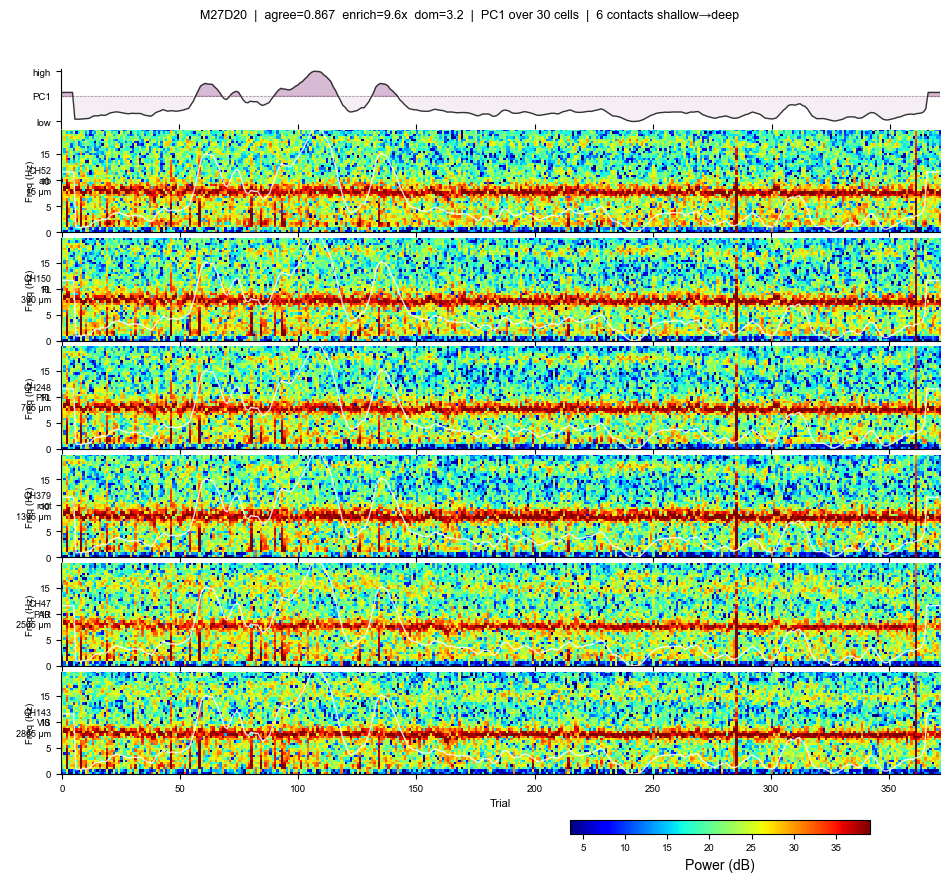

M28D17: loading spikes ... n_trials_beh=134  computing PC1 ... n_trials_pc1=132  n_cells=98
  loading LFP ... d=(125515, 384)
  Saved → M28D17_lfp_spectrogram.pdf


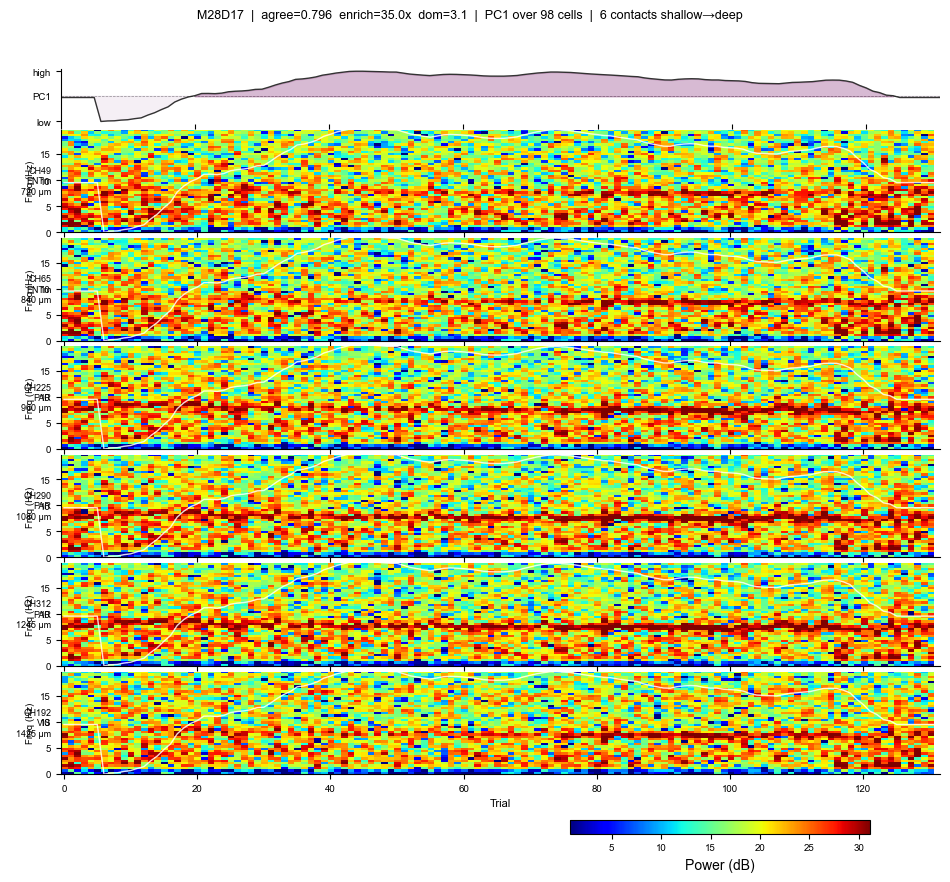

M26D18: loading spikes ... n_trials_beh=327  computing PC1 ... n_trials_pc1=320  n_cells=89
  loading LFP ... d=(108130, 384)
  Saved → M26D18_lfp_spectrogram.pdf


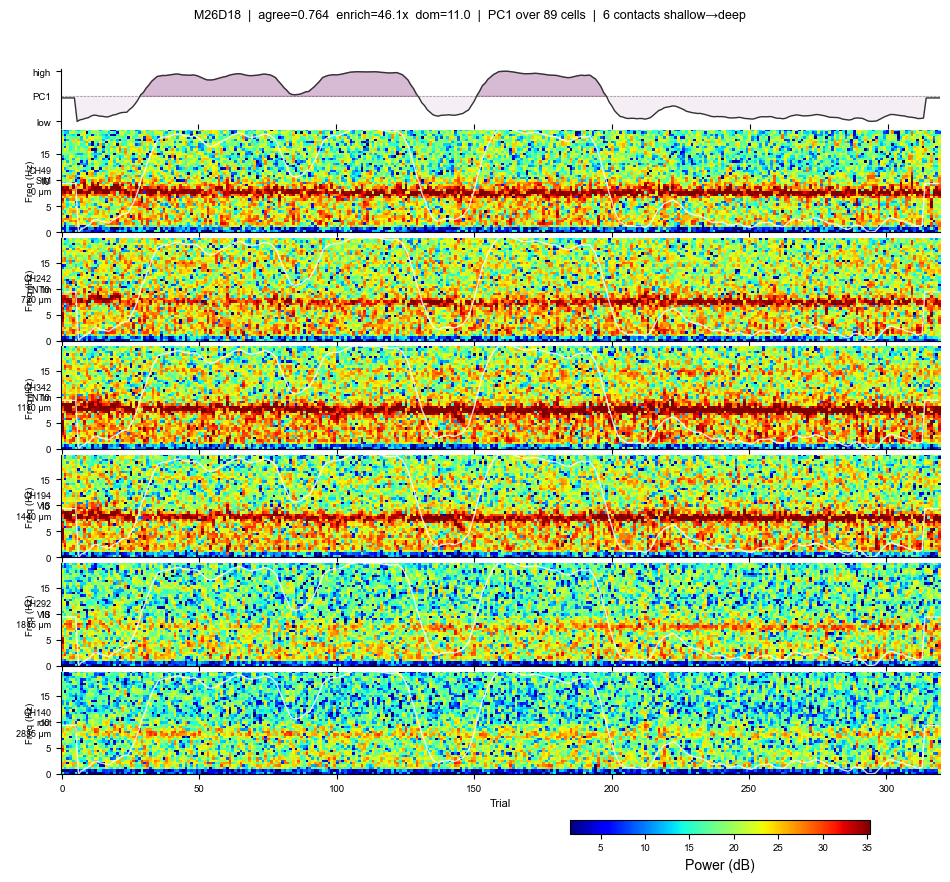

M25D24: loading spikes ... n_trials_beh=226  computing PC1 ... n_trials_pc1=225  n_cells=65
  loading LFP ... d=(111463, 384)
  Saved → M25D24_lfp_spectrogram.pdf


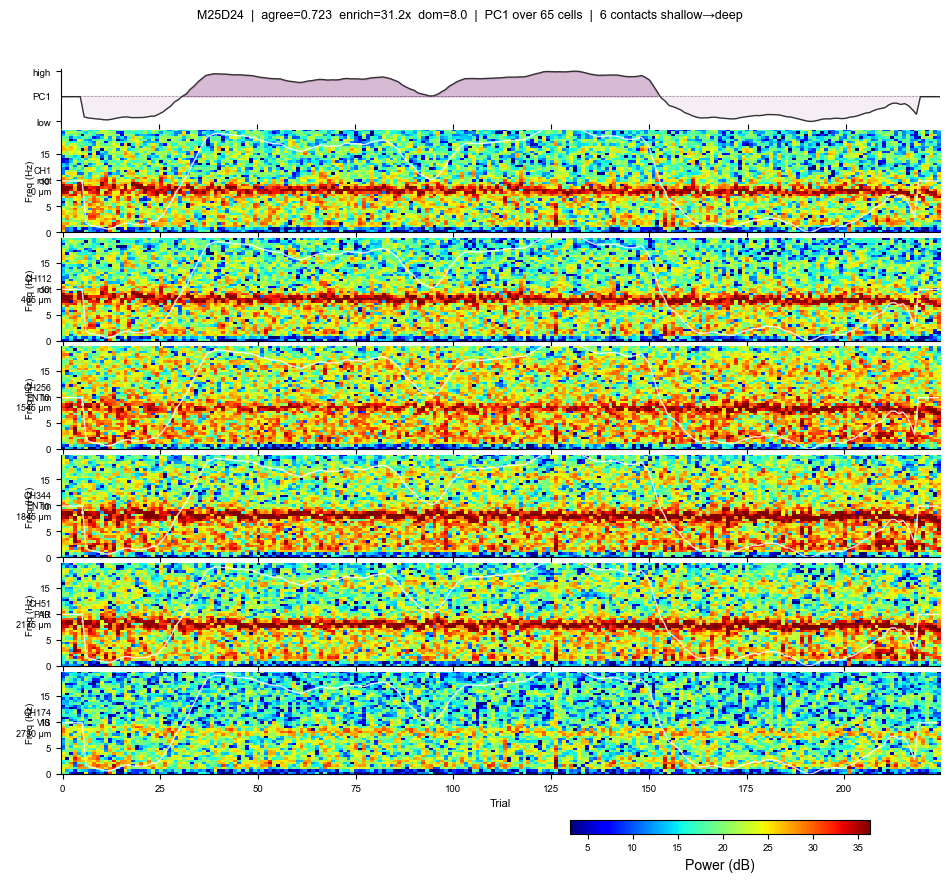

M25D20: loading spikes ... n_trials_beh=355  computing PC1 ... n_trials_pc1=351  n_cells=61
  loading LFP ... d=(108401, 384)
  Saved → M25D20_lfp_spectrogram.pdf


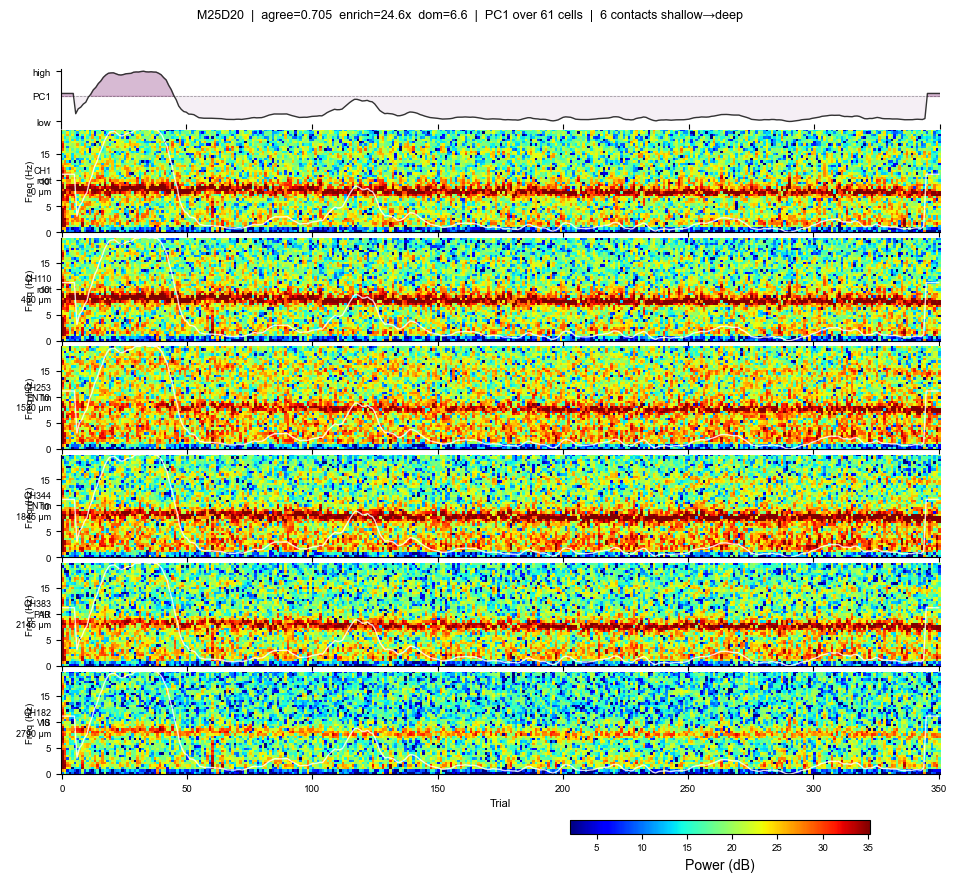

M28D16: loading spikes ... n_trials_beh=136  computing PC1 ... n_trials_pc1=134  n_cells=100
  loading LFP ... d=(111866, 384)
  Saved → M28D16_lfp_spectrogram.pdf


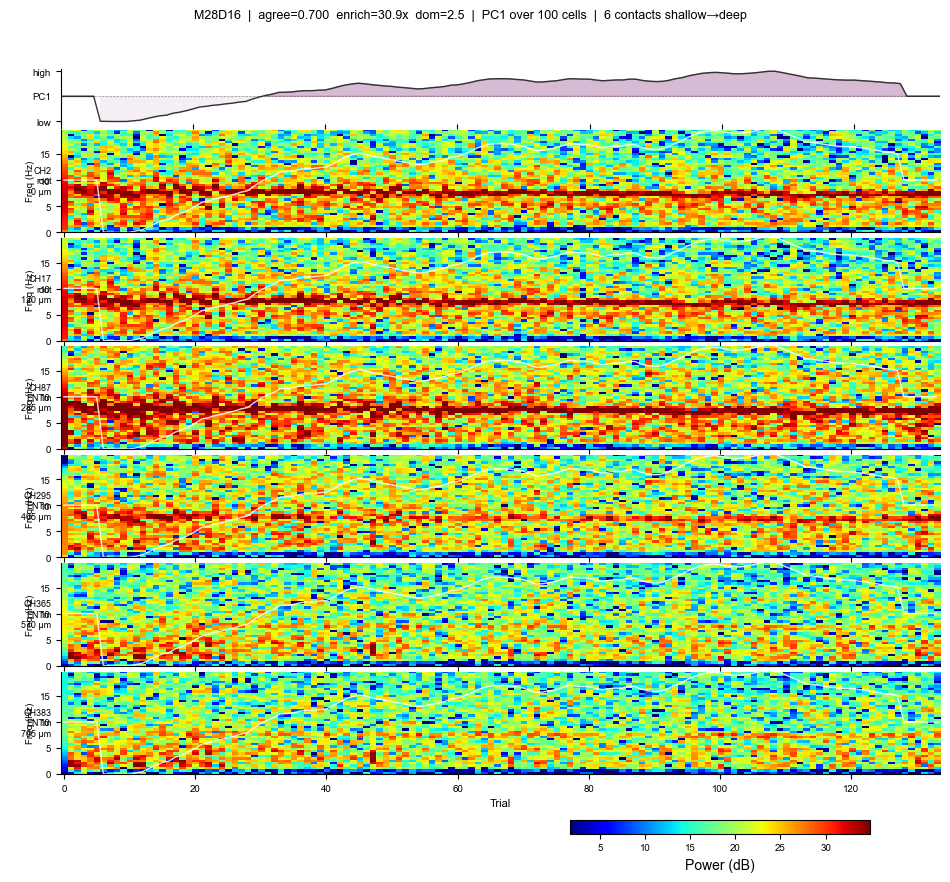

M29D21: loading spikes ... n_trials_beh=204  computing PC1 ... n_trials_pc1=202  n_cells=137
  loading LFP ... d=(124485, 384)
  Saved → M29D21_lfp_spectrogram.pdf


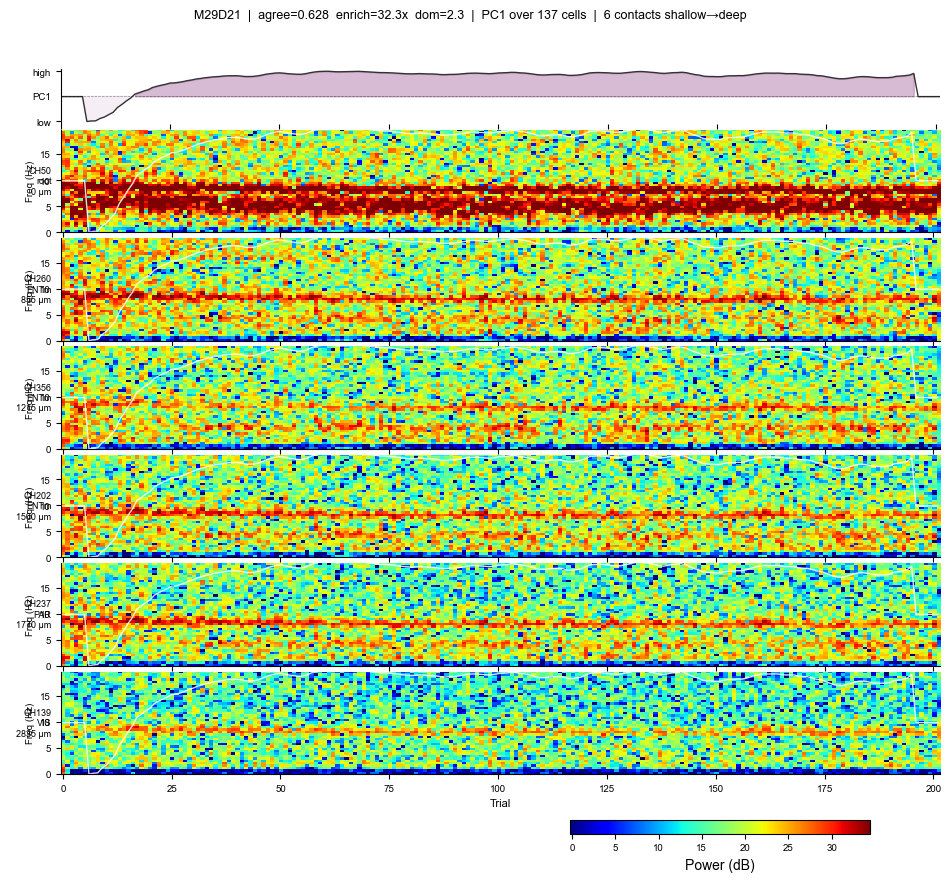

M29D17: loading spikes ... n_trials_beh=186  computing PC1 ... n_trials_pc1=184  n_cells=144
  loading LFP ... d=(162047, 384)
  Saved → M29D17_lfp_spectrogram.pdf


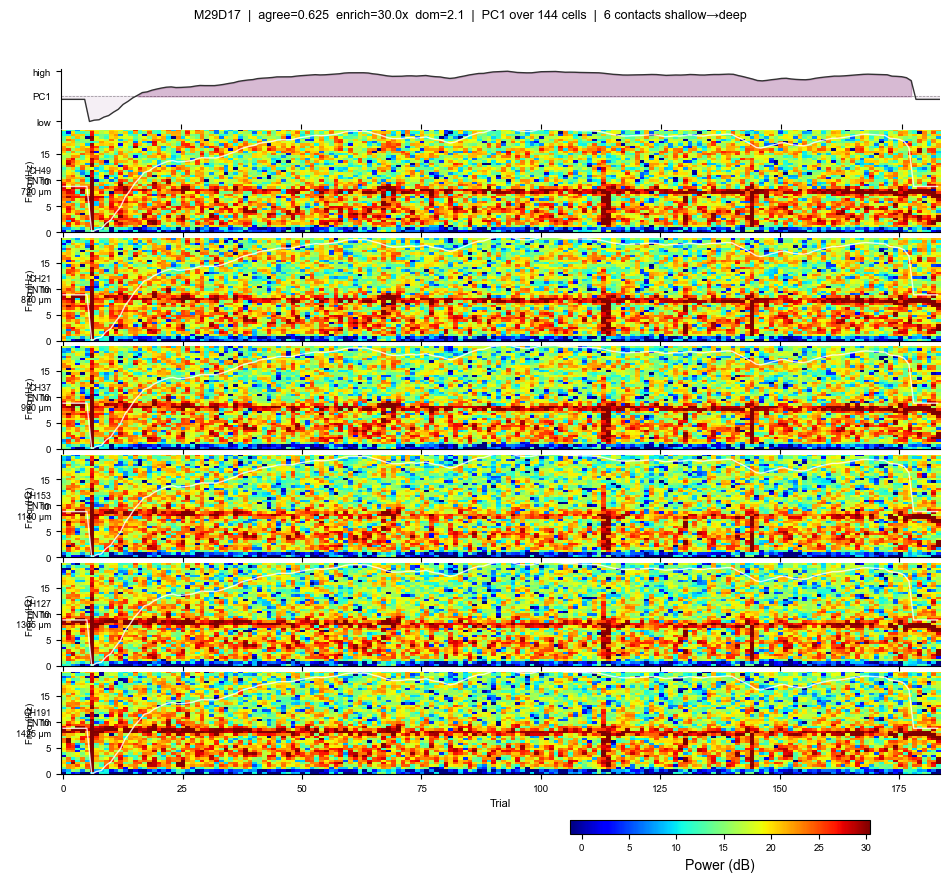

M29D25: loading spikes ... n_trials_beh=185  computing PC1 ... n_trials_pc1=182  n_cells=219
  loading LFP ... d=(126087, 384)
  Saved → M29D25_lfp_spectrogram.pdf


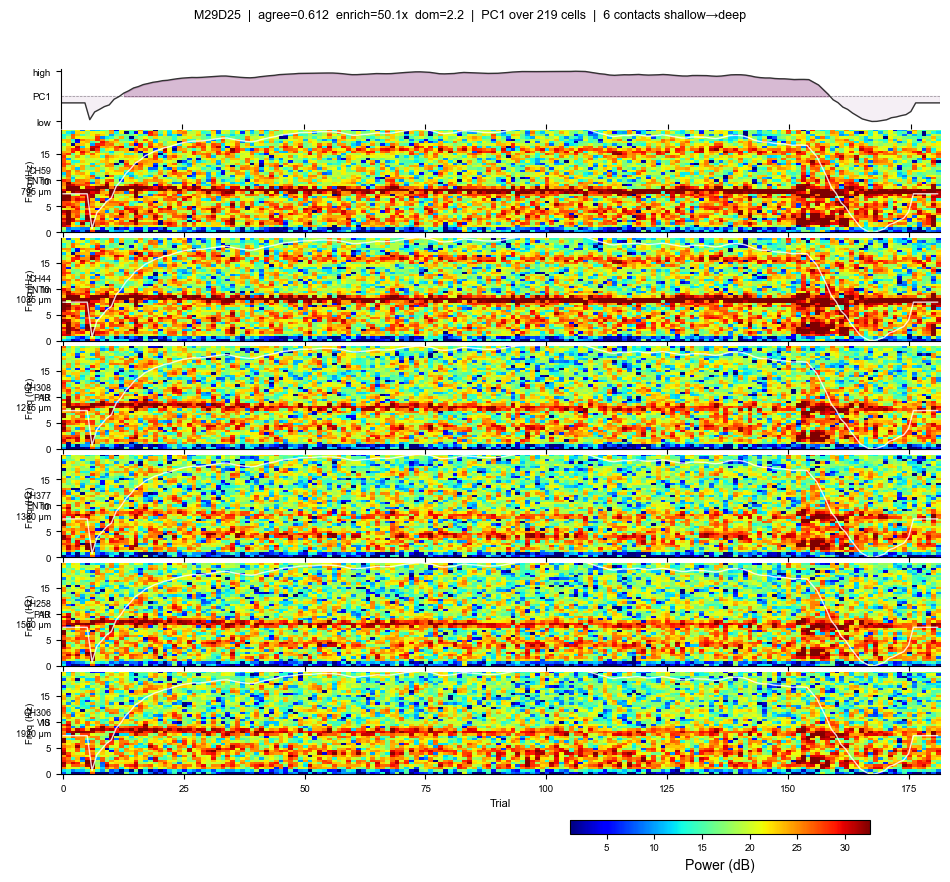

M25D25: loading spikes ... n_trials_beh=227  computing PC1 ... n_trials_pc1=218  n_cells=146
  loading LFP ... d=(108435, 384)
  Saved → M25D25_lfp_spectrogram.pdf


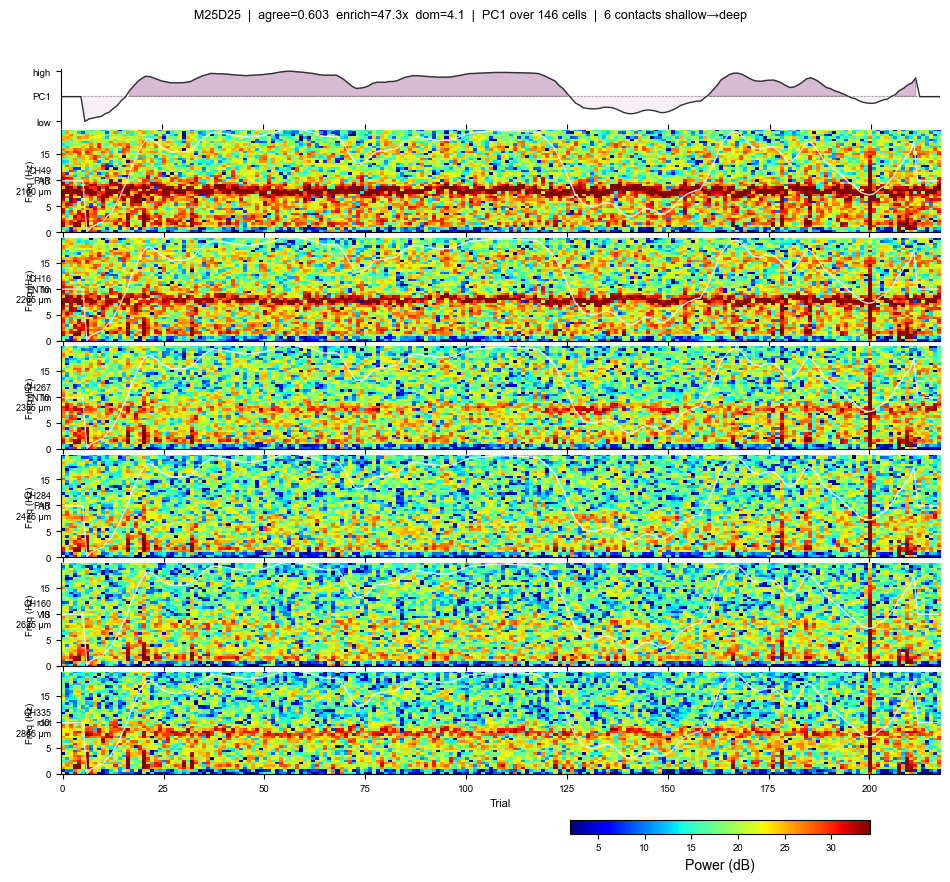

M28D19: loading spikes ... n_trials_beh=154  computing PC1 ... n_trials_pc1=153  n_cells=125
  loading LFP ... d=(117130, 384)
  Saved → M28D19_lfp_spectrogram.pdf


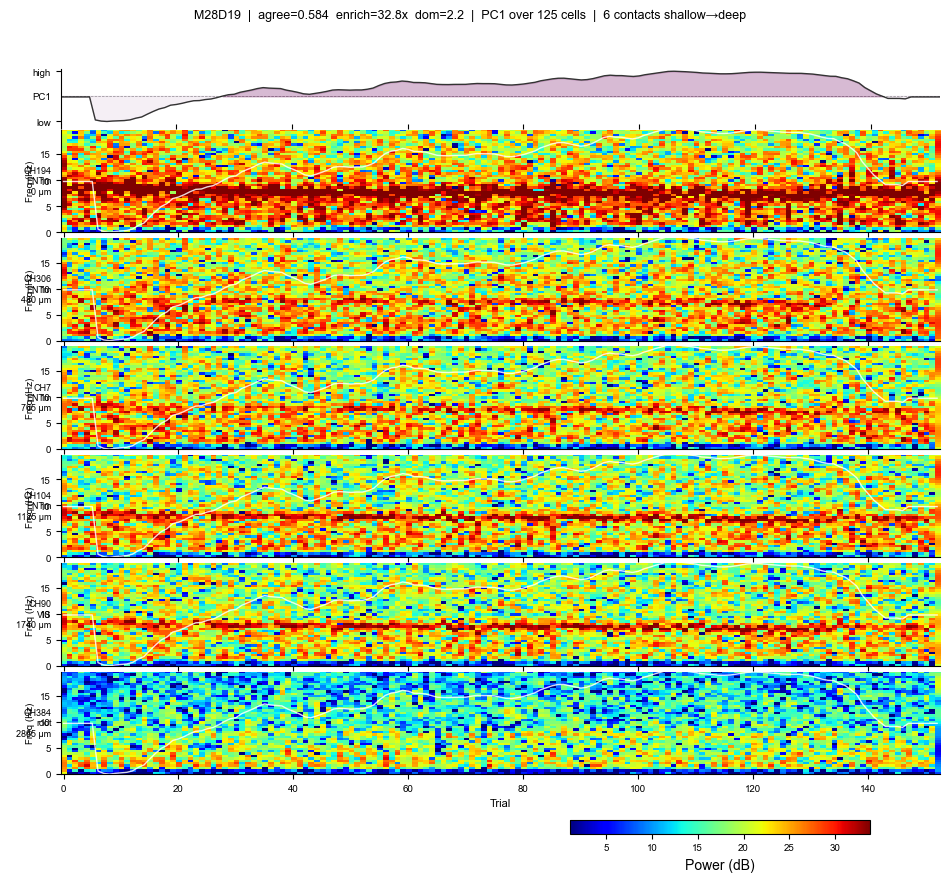

M26D17: loading spikes ... n_trials_beh=288  computing PC1 ... n_trials_pc1=284  n_cells=22
  loading LFP ... d=(110583, 384)
  Saved → M26D17_lfp_spectrogram.pdf


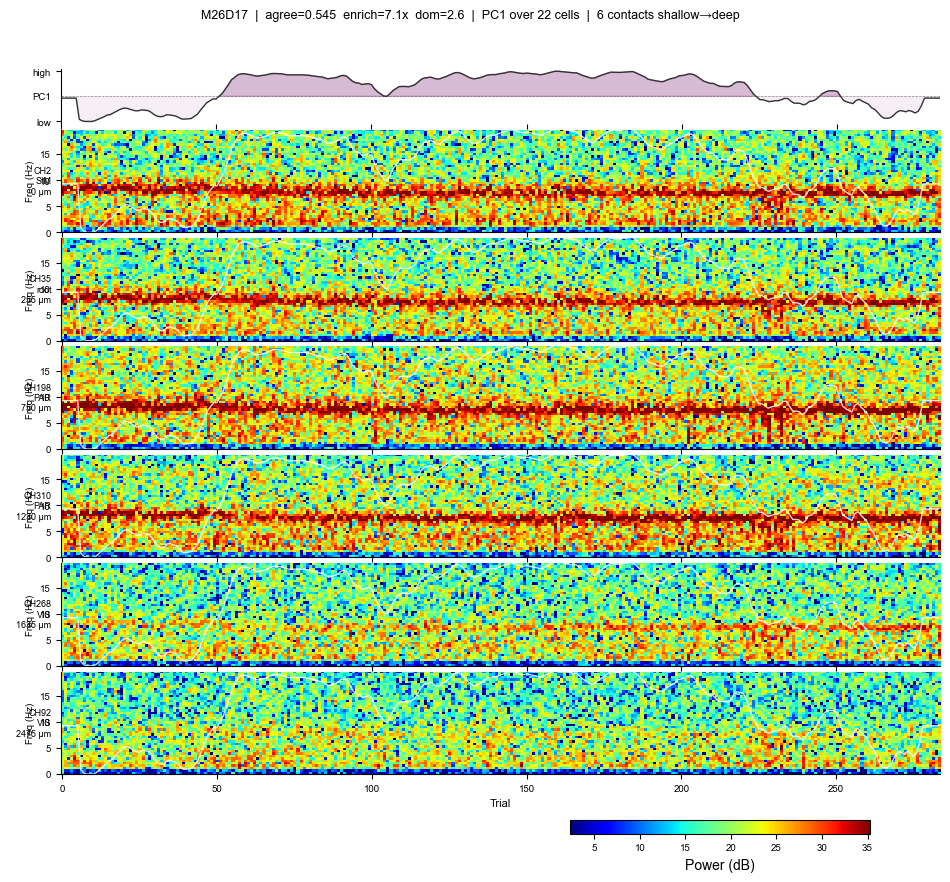

M25D23: loading spikes ... n_trials_beh=215  computing PC1 ... n_trials_pc1=203  n_cells=192
  loading LFP ... d=(99389, 384)
  Saved → M25D23_lfp_spectrogram.pdf


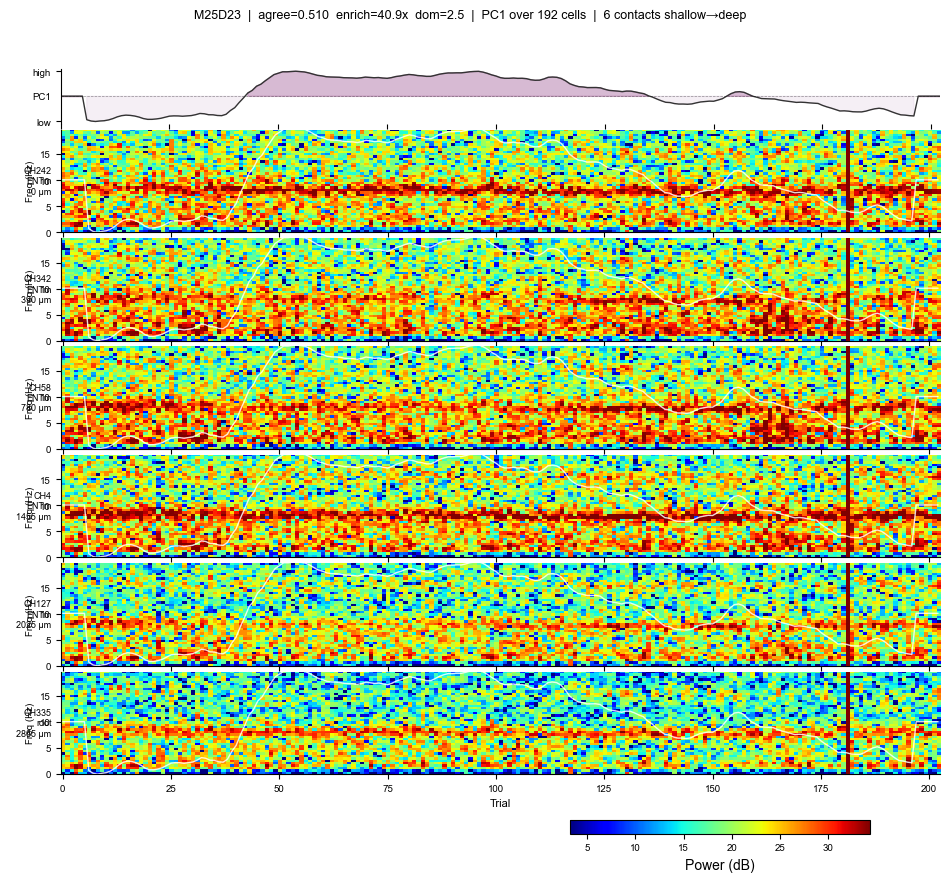

M27D23: loading spikes ... n_trials_beh=398  computing PC1 ... n_trials_pc1=396  n_cells=111
  loading LFP ... d=(110073, 384)
  Saved → M27D23_lfp_spectrogram.pdf


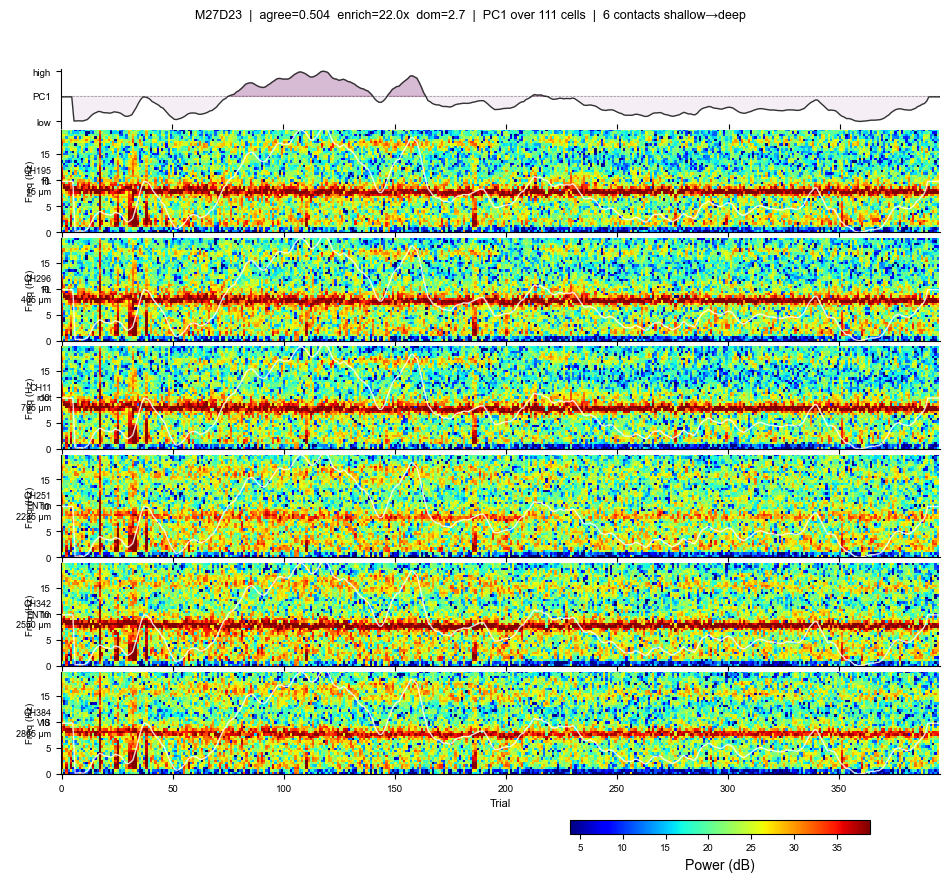

M26D16: loading spikes ... n_trials_beh=279  computing PC1 ... n_trials_pc1=276  n_cells=47
  loading LFP ... d=(108532, 384)
  Saved → M26D16_lfp_spectrogram.pdf


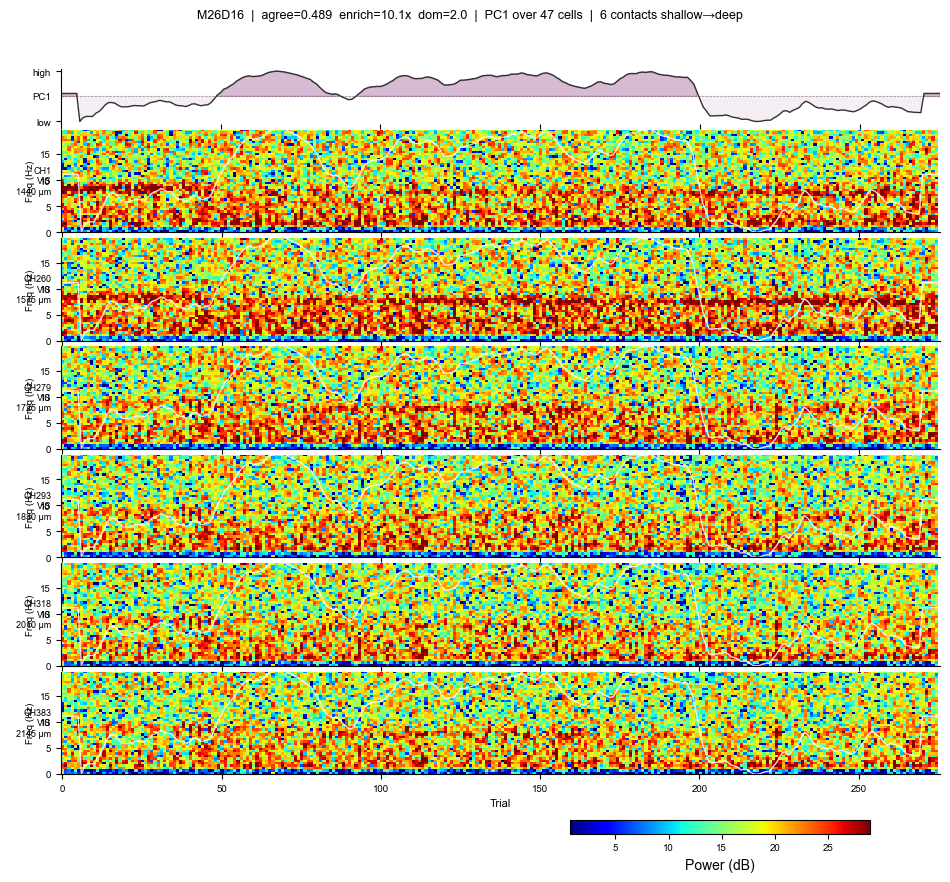

M22D38: loading spikes ... n_trials_beh=249  computing PC1 ... n_trials_pc1=246  n_cells=206
  loading LFP ... d=(108462, 384)
  Saved → M22D38_lfp_spectrogram.pdf


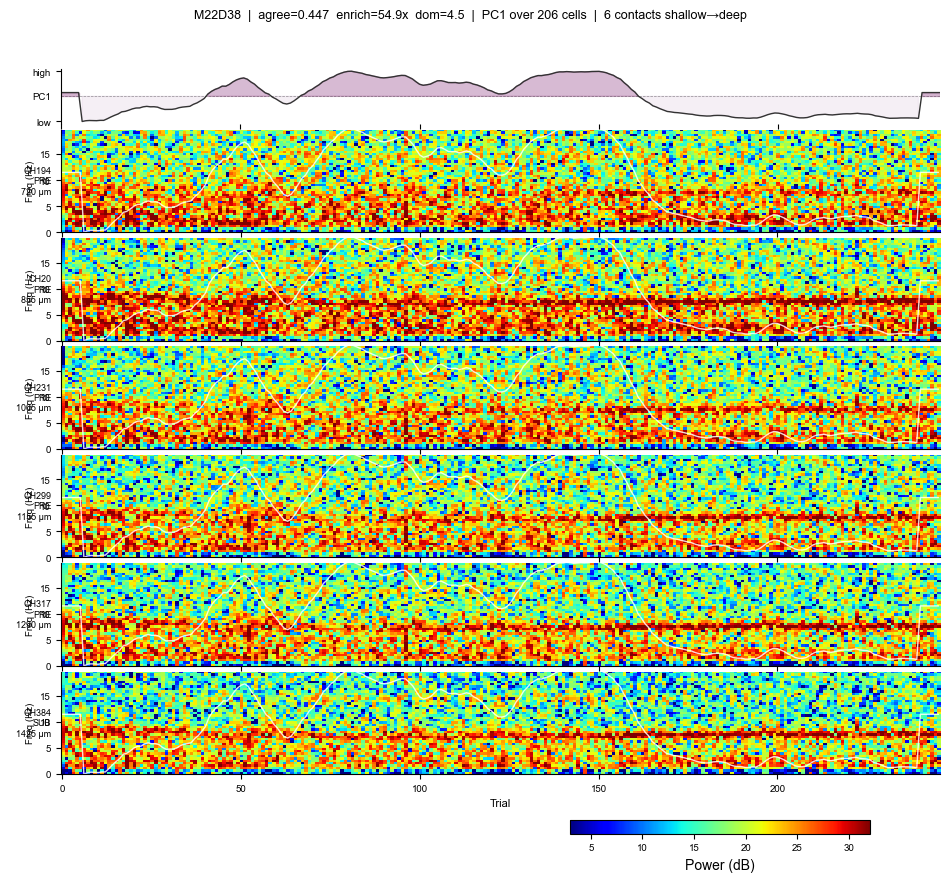

M21D19: loading spikes ... n_trials_beh=110  computing PC1 ... n_trials_pc1=109  n_cells=391
  loading LFP ... d=(109178, 384)
  Saved → M21D19_lfp_spectrogram.pdf


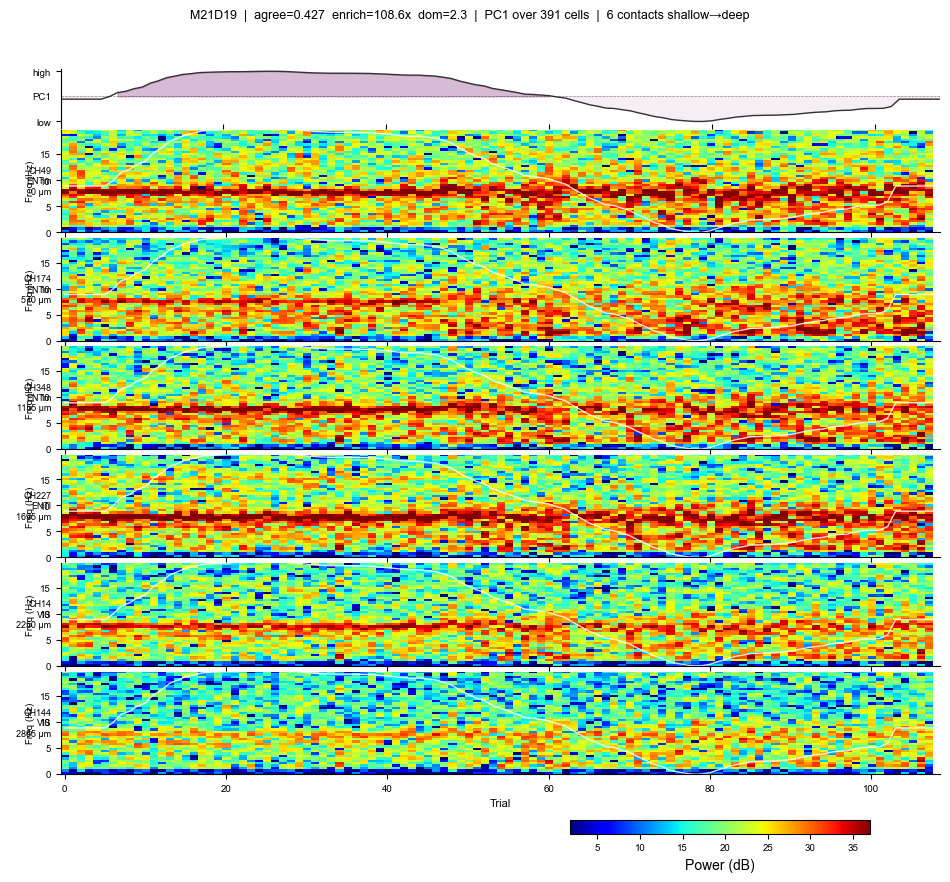

M26D19: loading spikes ... n_trials_beh=334  computing PC1 ... n_trials_pc1=332  n_cells=344
  loading LFP ... d=(109706, 384)
  Saved → M26D19_lfp_spectrogram.pdf


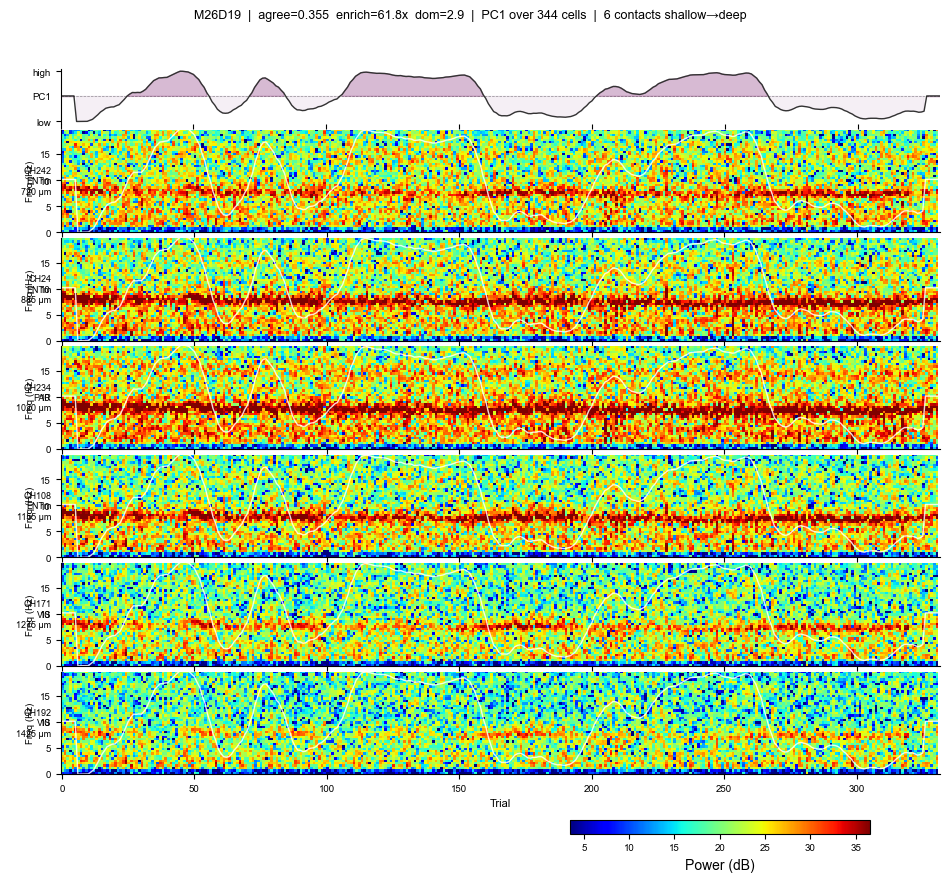

M20D25: loading spikes ... n_trials_beh=401  computing PC1 ... n_trials_pc1=395  n_cells=35
  loading LFP ... d=(109313, 384)
  Saved → M20D25_lfp_spectrogram.pdf


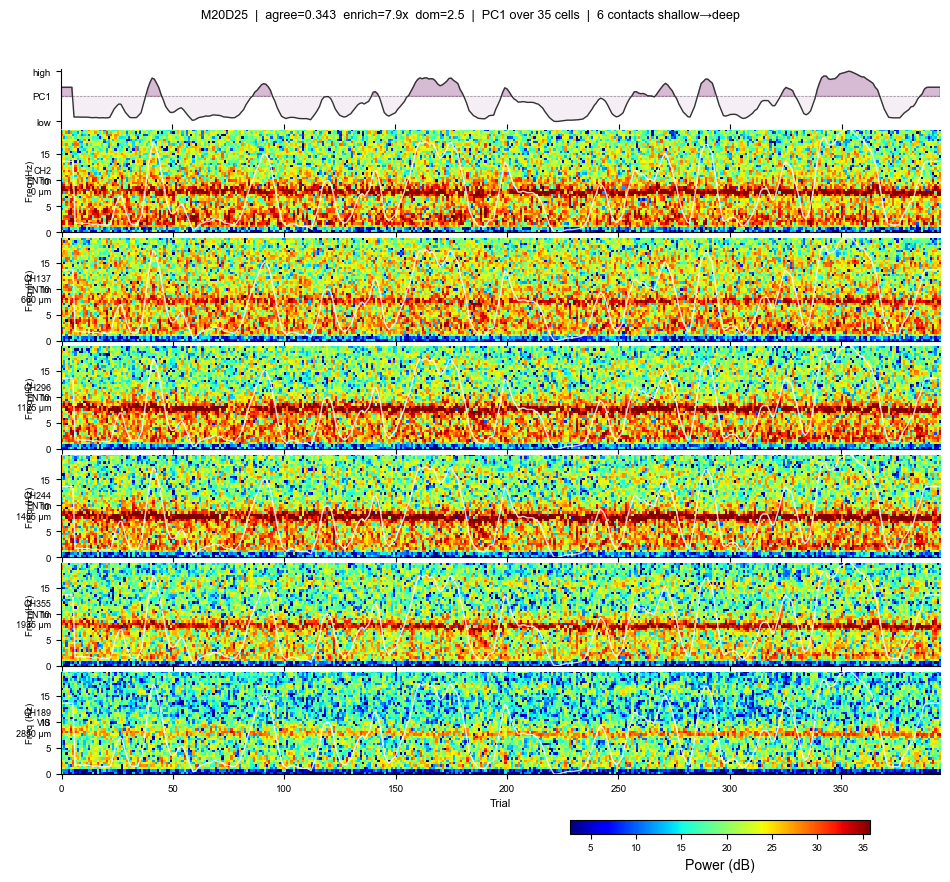

M27D24: loading spikes ... n_trials_beh=368  computing PC1 ... n_trials_pc1=366  n_cells=193
  loading LFP ... d=(108125, 384)
  Saved → M27D24_lfp_spectrogram.pdf


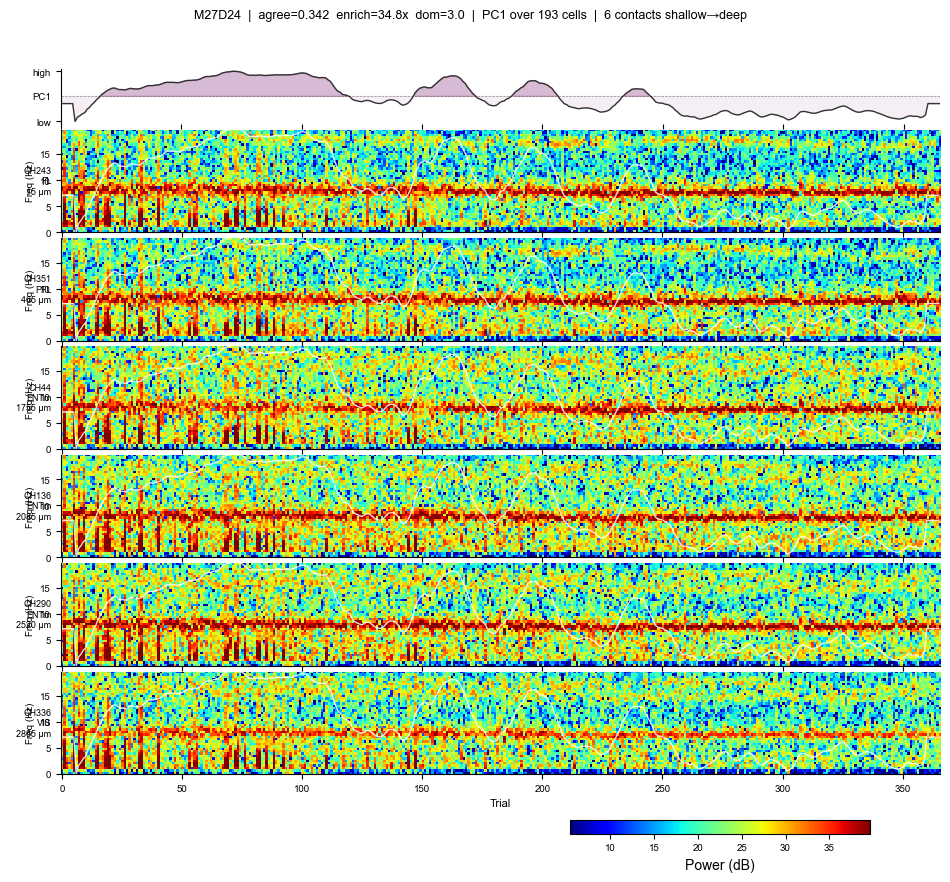

In [5]:
# ── Run: plot all sessions with LFP files available ───────────────────────────
from IPython.display import display as _disp

for _, r in df_pass[df_pass['lfp_available']].iterrows():
    fig = plot_session_lfp(
        mouse          = int(r.mouse),
        day            = int(r.day),
        agree_frac     = r.agree_frac,
        pc1_enrichment = r.pc1_enrichment,
        pc1_dominance  = r.pc1_dominance,
        save           = True,
    )
    if fig is not None:
        _disp(fig)
        plt.close(fig)

M26D18: loading spikes ... n_trials_beh=327  computing PC1 ... n_trials_pc1=320  n_cells=89
  loading LFP ... d=(108130, 384)
  Saved → M26D18_lfp_spectrogram.pdf


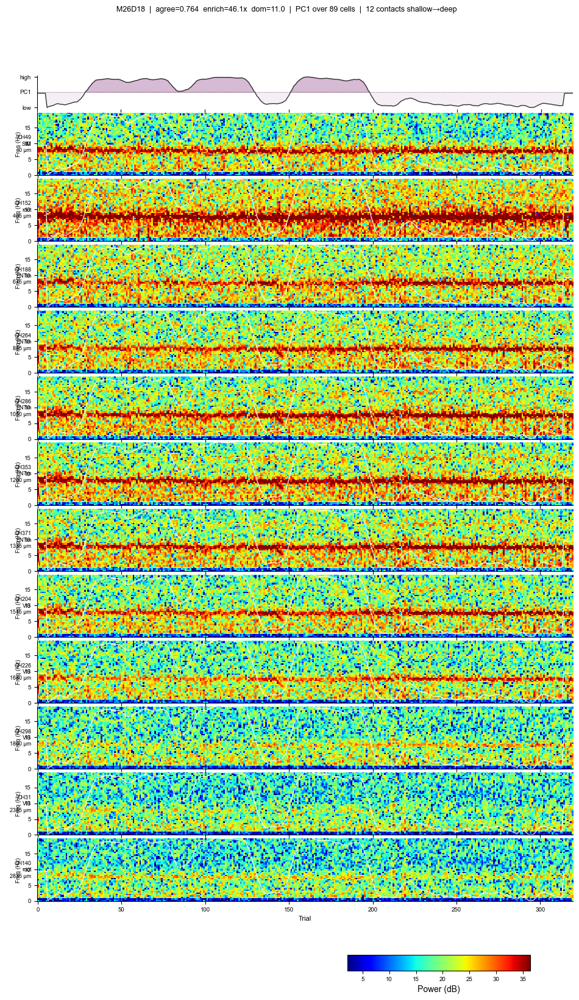

In [6]:
# ── Optional: single-session deep dive (run after downloading more sessions) ───
# Change MOUSE_DETAIL / DAY_DETAIL and N_CONTACTS_DETAIL to inspect a single session.

MOUSE_DETAIL      = 26
DAY_DETAIL        = 18
N_CONTACTS_DETAIL = 12

from IPython.display import display as _disp

row = df_pass[(df_pass['mouse'] == MOUSE_DETAIL) & (df_pass['day'] == DAY_DETAIL)]
if len(row) == 0:
    print('Session not in passing list.')
else:
    r   = row.iloc[0]
    fig = plot_session_lfp(
        mouse          = int(r.mouse),
        day            = int(r.day),
        agree_frac     = r.agree_frac,
        pc1_enrichment = r.pc1_enrichment,
        pc1_dominance  = r.pc1_dominance,
        n_contacts     = N_CONTACTS_DETAIL,
        save           = True,
    )
    if fig is not None:
        _disp(fig)
        plt.close(fig)